In [6]:
import pandas as pd
import numpy as np
import chart_studio.plotly as px
import cufflinks as cf
import seaborn as sns
import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
cf.go_offline()

In [7]:
arr_1 = np.random.rand(50, 4)
df_1 = pd.DataFrame(arr_1, columns=['A', 'B', 'C', 'D'])

In [9]:
df_1.head()

,A,B,C,D
0,0.404919,0.678466,0.436339,0.137244
1,0.073815,0.447603,0.948470,0.141375
2,0.388548,0.773052,0.281733,0.717609
3,0.235017,0.946220,0.317216,0.199051
4,0.005331,0.188567,0.059000,0.235103


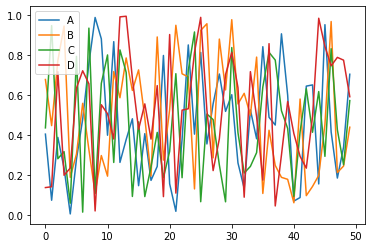

In [10]:
# standard plot
df_1.plot()

In [11]:
# improved plot
df_1.iplot()

In [13]:
import plotly.graph_objects as go
df_stocks = px.data.stocks()
px.line(df_stocks, x='date', y='GOOG', labels={'x': 'Date', 'y': 'Price'})


In [14]:
px.line(df_stocks, x='date', y=['GOOG', 'AAPL'], labels={'x': 'Date', 'y': 'Price'}, title='Apple vs Google')

In [15]:
# complex data plots using Figure
fig = go.Figure()

In [24]:
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AAPL, mode='lines', name='Apple'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.AMZN, mode='lines+markers', name='Amazon'))
fig.add_trace(go.Scatter(x=df_stocks.date, y=df_stocks.GOOG, mode='lines+markers', name='Google', line=dict(color='firebrick', width=2, dash='dashdot')))
fig.update_layout(title='Stock Price Data 2018-2020', xaxis_title='Price', yaxis_title='Date')



In [23]:

fig.update_layout(
  xaxis=dict(showline=True, showgrid=False, showticklabels=True, linecolor='rgb(204, 204, 204)', linewidth=2, ticks='outside', 
  tickfont=dict(family='Arial', size=12, color='rgb(82, 82, 82)')),
  yaxis=dict(showline=False, zeroline=False, showgrid=False, showticklabels=False),
  autosize=False,
  margin=dict(autoexpand=False, l=100, r=20, t=110, ),
  showlegend=False, plot_bgcolor='white')

In [25]:
# Bar charts

df_us = px.data.gapminder().query('country == "United States"')
px.bar(df_us, x='year', y='pop')

In [27]:
# Stacked bar
df_tips = px.data.tips()
px.bar(df_tips, x='day', y='tip', color='sex', title='Tips by Sex on each day', labels={'tip':'Tip amount', 'day':'Day of the week'})

In [28]:
px.bar(df_tips, x='sex', y='total_bill', color='smoker', barmode='group')

In [30]:
df_europe = px.data.gapminder().query('continent == "Europe" and year == 2007 and pop > 2.e6')
fig = px.bar(df_europe, y='pop', x='country', text='pop', color='country')
fig.show()

In [31]:
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8)
fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [32]:
# Scatter plots
df_iris = px.data.iris()
px.scatter(df_iris, x='sepal_width', y='sepal_length', color='species', size='petal_length', hover_data=['petal_width'])

In [34]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_iris.sepal_width, y=df_iris.sepal_length, mode='markers', marker_color=df_iris.sepal_width, text=df_iris.species, marker=dict(showscale=True)))
fig.update_traces(marker_line_width=2, marker_size=10)

In [36]:
fig = go.Figure(data=go.Scattergl(x=np.random.randn(100000), y=np.random.randn(100000), mode='markers', marker=dict(color=np.random.randn(100000), colorscale='Viridis', line_width=1)))
fig.show()

In [37]:
# Pie charts
df_asia = px.data.gapminder().query('year == 2007').query('continent == "Asia"')
px.pie(df_asia, values='pop', names='country', title='Population of Asian continent', color_discrete_sequence=px.colors.sequential.RdBu)

In [39]:
colors = ['blue', 'green', 'black', 'purple', 'red', 'brown']
fig = go.Figure(data=[go.Pie(labels=['Water', 'Grass', 'Normal', 'Psychic', 'Fire', 'Ground'], values=[110, 90, 80, 70, 60])])
fig.update_traces(hoverinfo='label+percent', textfont_size=20, textinfo='label+percent', pull=[0.1, 0, 0.2, 0, 0, 0], marker=dict(colors=colors, line=dict(color='#FFFFFF', width=2)))
fig.show()